In [202]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

## Loading data

In [203]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


## 

In [204]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [205]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


### Checking Missing values

In [206]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [207]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature 
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [208]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [209]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss 
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [210]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [211]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [212]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [213]:
# checking mising values once again
# The remaining missing will then be imputed 
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [214]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [215]:
# # Making it compatible with Pipelines
# from sklearn.base import BaseEstimator, TransformerMixin

# class MissingValueImputer(BaseEstimator, TransformerMixin):
#     def __init__(self, features):
#         self.features = features
    
#     def fit(self, X, y=None):
#         return self
    
#     def transform(self, X):
#         X_copy = X.copy()
#         for f in self.features:
#             X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
#         return X_copy.reset_index()

# # Example usage:
# imputer = MissingValueImputer(features=with_missing)
# df_train = imputer.transform(df_train).drop('index', axis=1)
# df_test = imputer.transform(df_test).drop('index', axis=1)

def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()
    
    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values 
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [216]:
type(df_train)

pandas.core.frame.DataFrame

In [217]:
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [218]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
1,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
3,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
4,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1244,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
1245,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
1246,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
1247,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [219]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [220]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

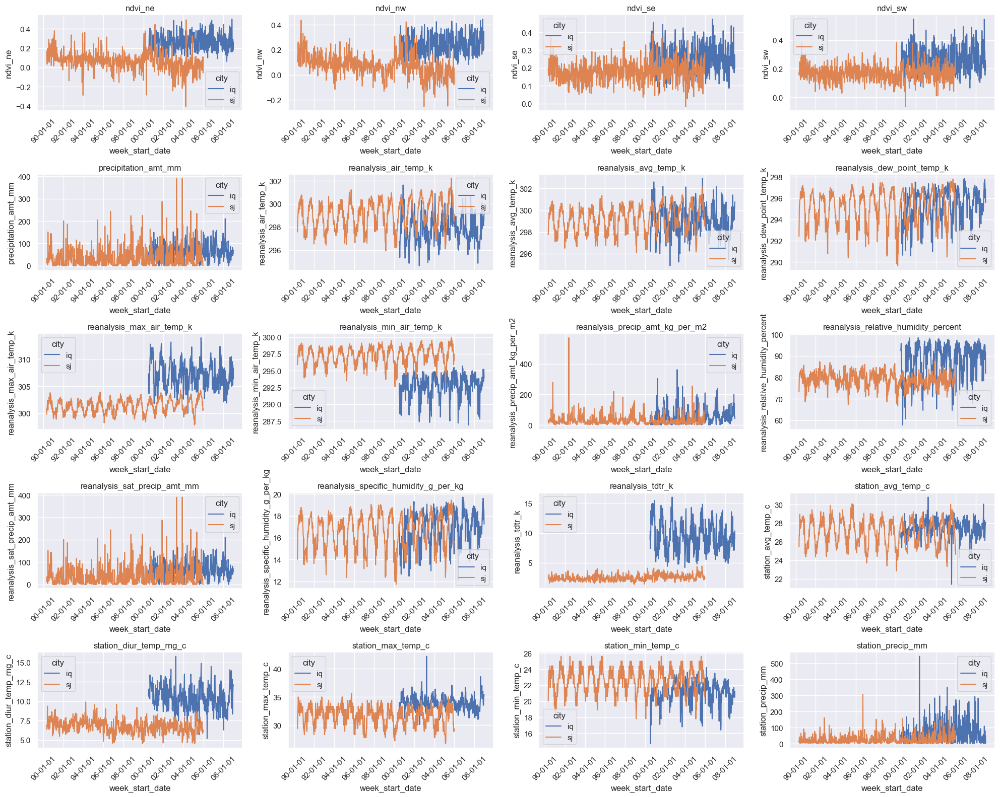

In [221]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


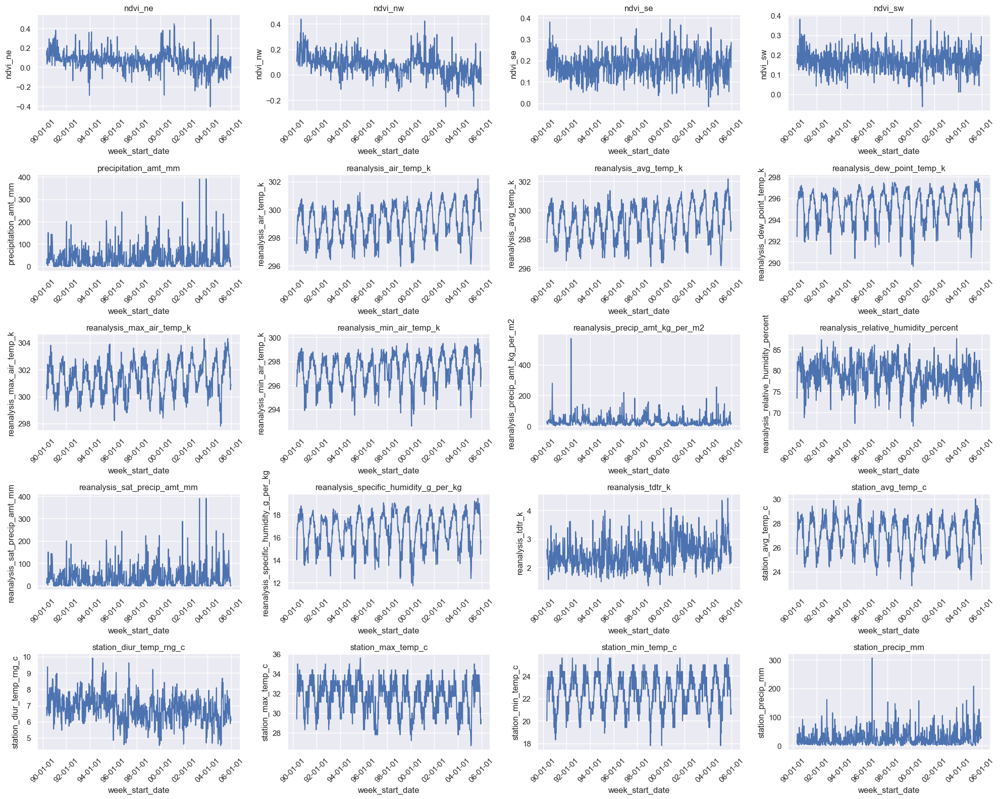

In [222]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

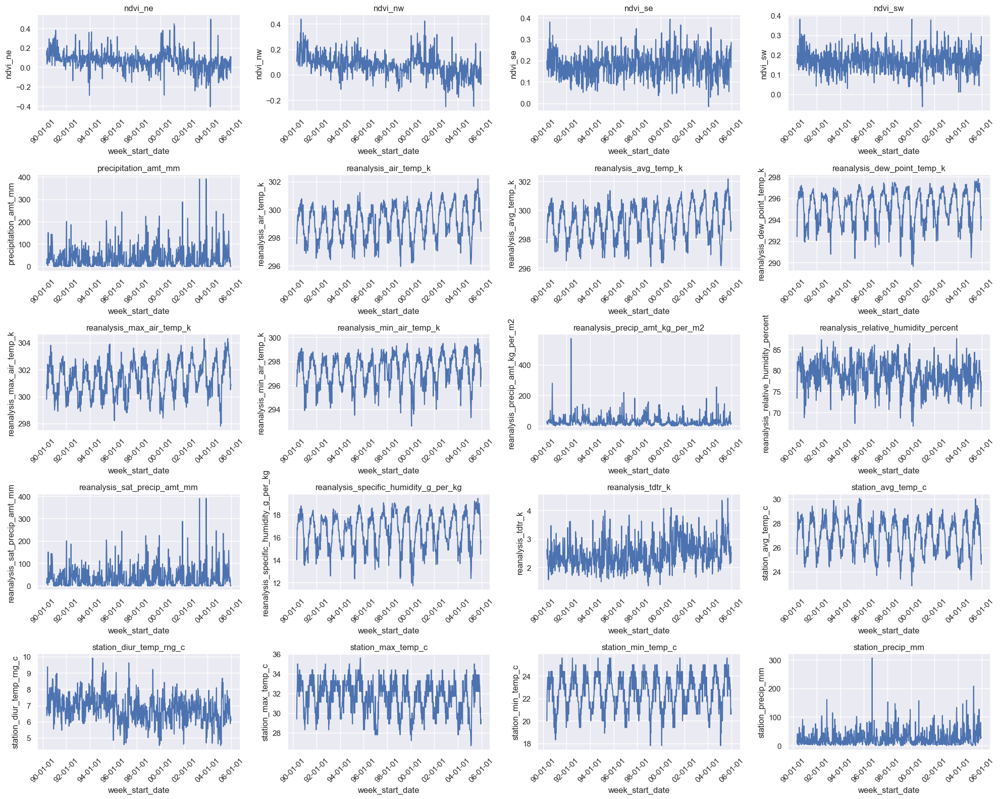

In [223]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




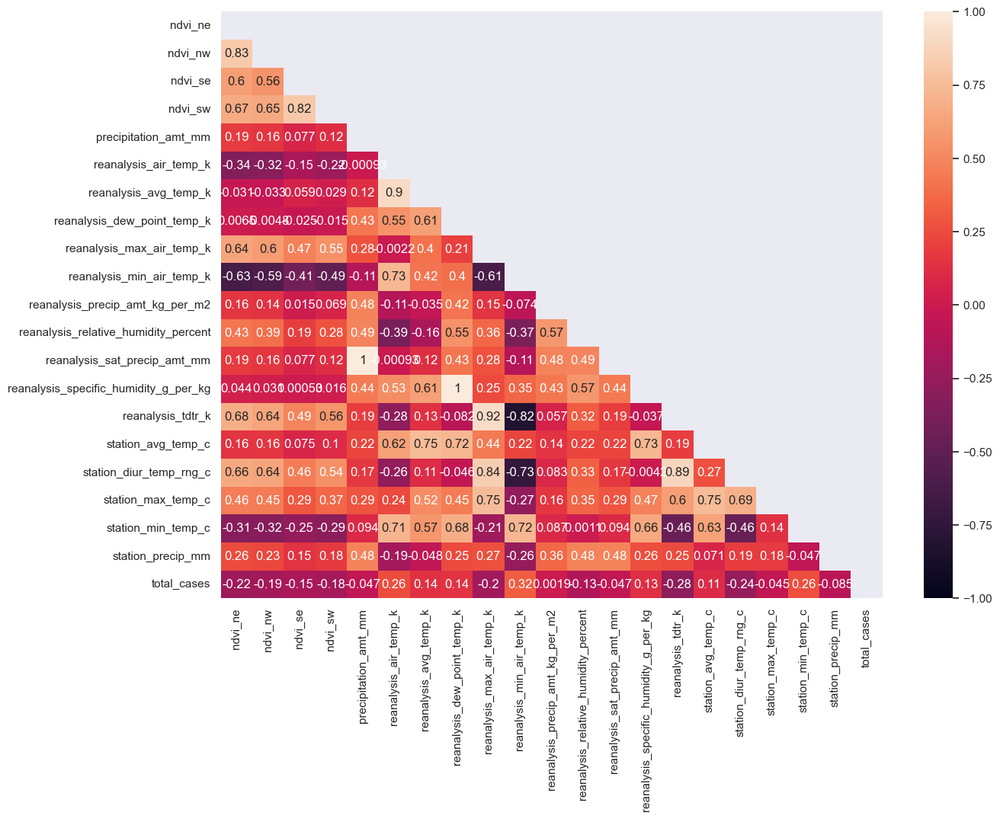

In [224]:
corrMat = df_train.loc[:,features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


### Identify highly correlated variables``

In [225]:
# corrMat[corrMat>0.9]
pair = []
for c in corrMat:
    if any(corrMat[c]>0.9) or any(corrMat[c]<-0.9):
        high_corr = corrMat[corrMat[c]>0.9].index.to_list()
    if len(high_corr)>1:
        print(high_corr)

['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']
['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']


In [226]:
from sklearn.manifold import MDS
dist_mat=1-corrMat
mds = MDS(n_components=2, dissimilarity='precomputed', normalized_stress='auto')
mds_out = mds.fit_transform(dist_mat)

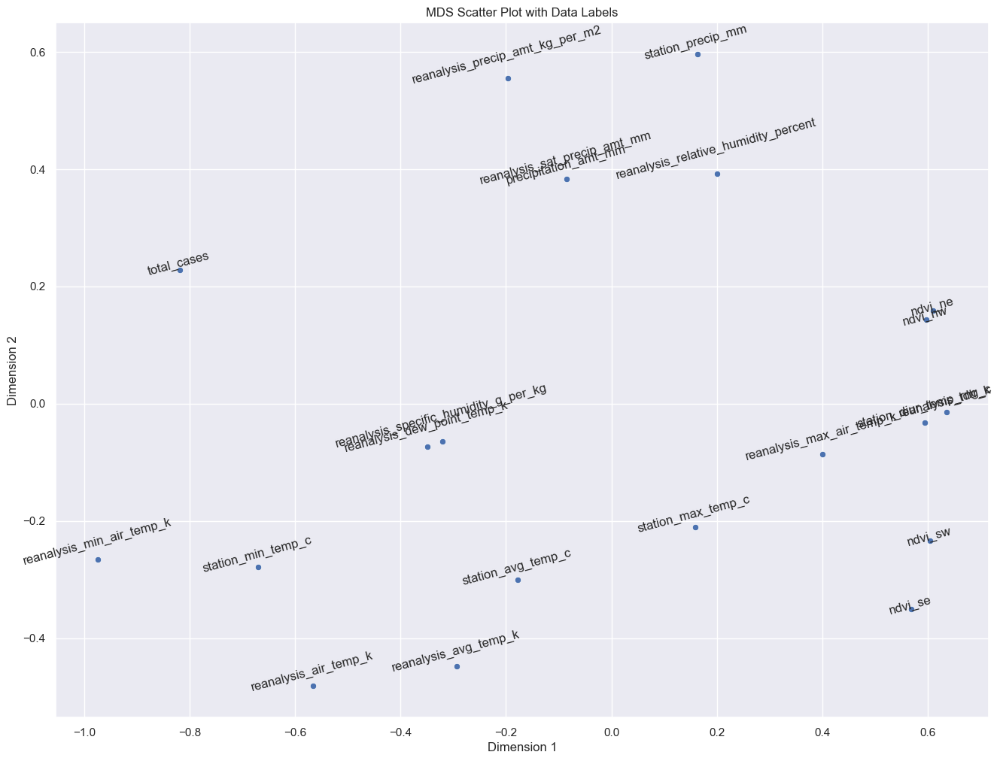

In [227]:
mds_out = pd.DataFrame(mds_out, columns=['c1', 'c2'])
mds_out.index = mds.feature_names_in_

plt.figure(figsize=(16, 12))
sns.scatterplot(data=mds_out,x='c1', y='c2')

for label, x, y in zip(mds_out.index, mds_out['c1'], mds_out['c2']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(-1, -5), ha='center', rotation=15)

# Show the plot
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('MDS Scatter Plot with Data Labels')
plt.show()

In [228]:
mds.feature_names_in_

array(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
       'total_cases'], dtype=object)

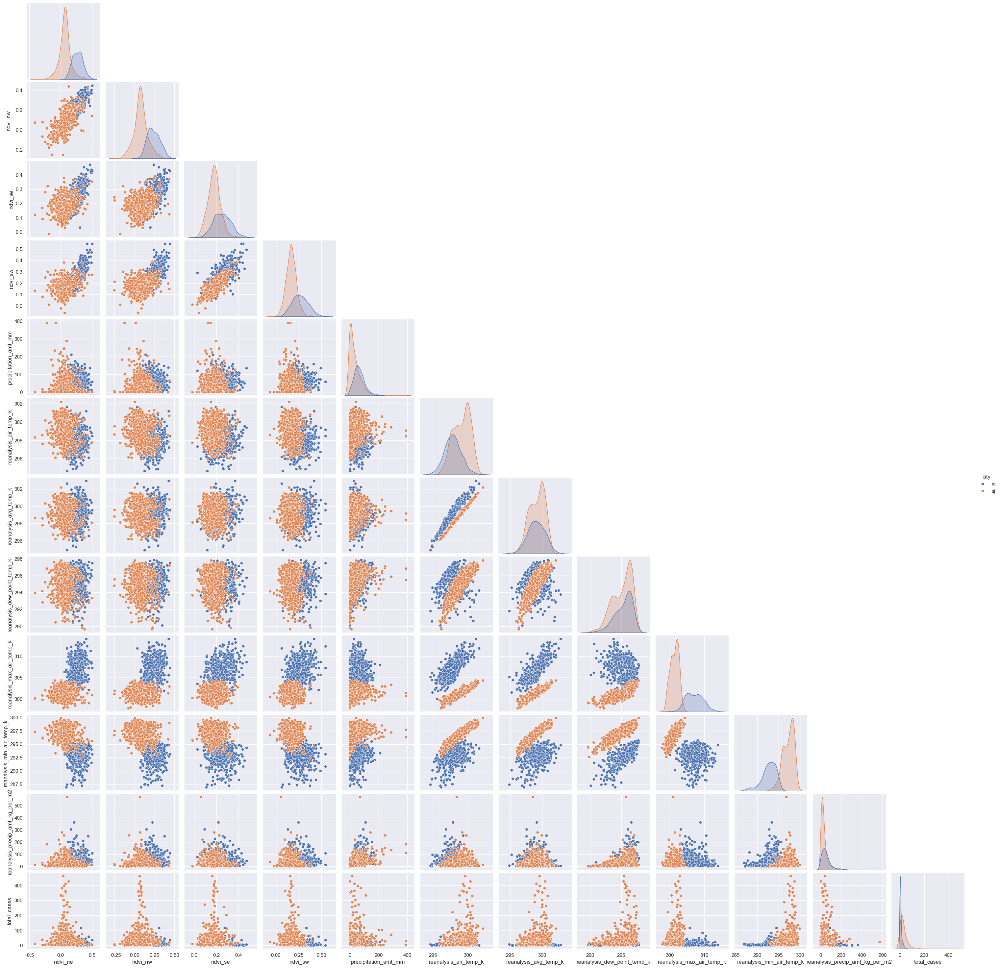

In [229]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

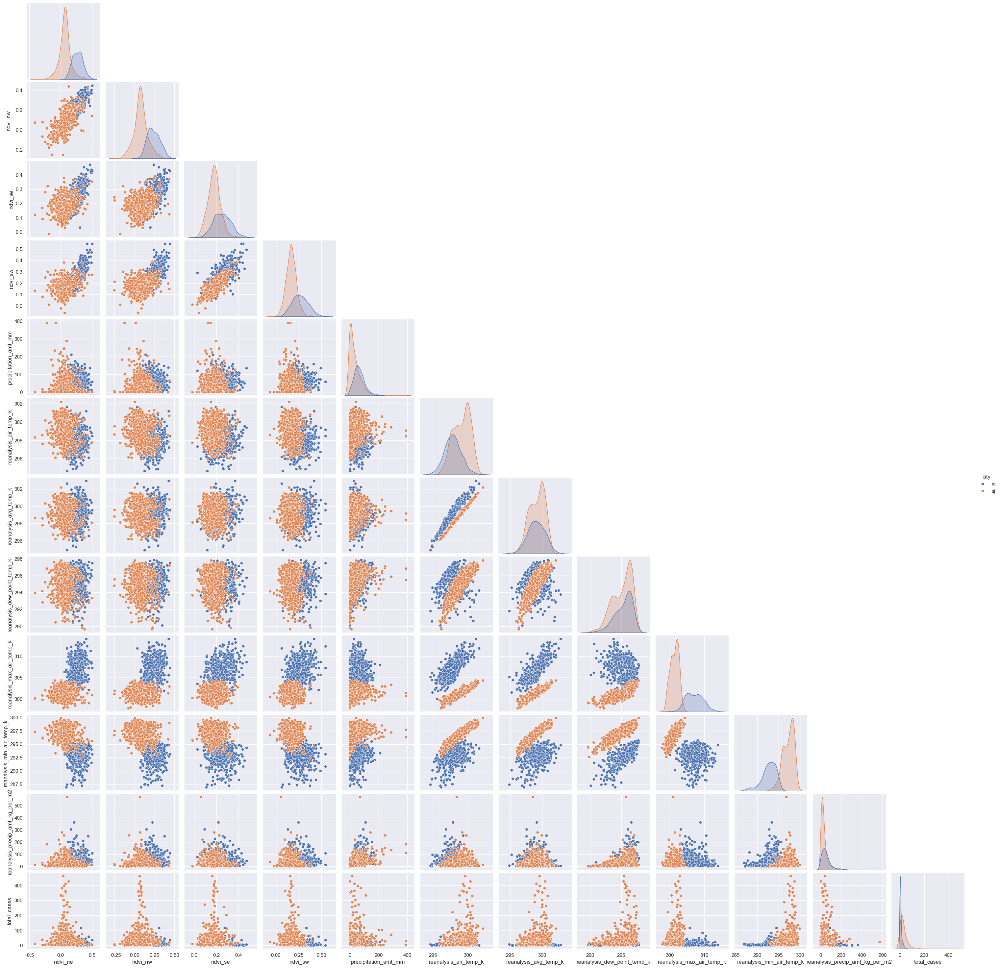

In [230]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps

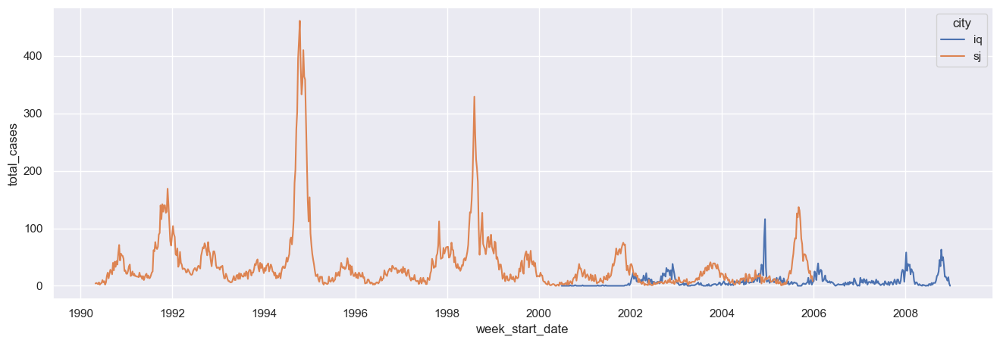

In [231]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

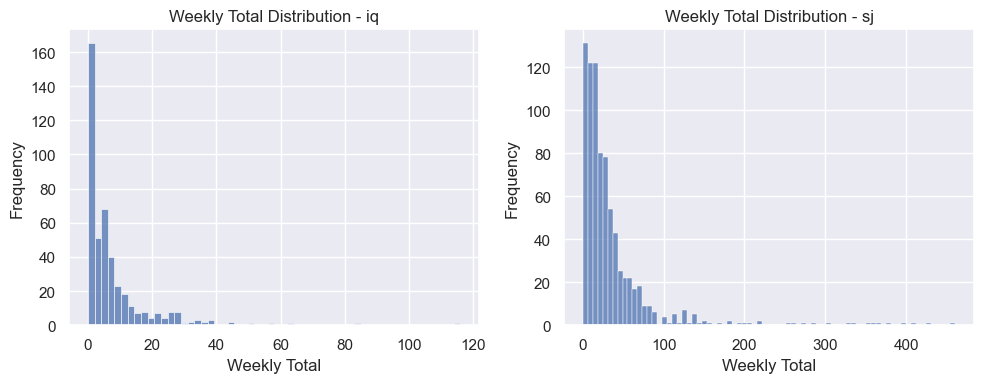

In [232]:
# 
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for i, city in enumerate(cities):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'Weekly Total Distribution - {city}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


yearly_pattern(df_train, 'city', 'total_cases')

Seems like week 1 and week 53 are the most problematic in the dataset

In [233]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [234]:
df_med


,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by 
 - There is considerable difference in climate and vegetation between the two cities

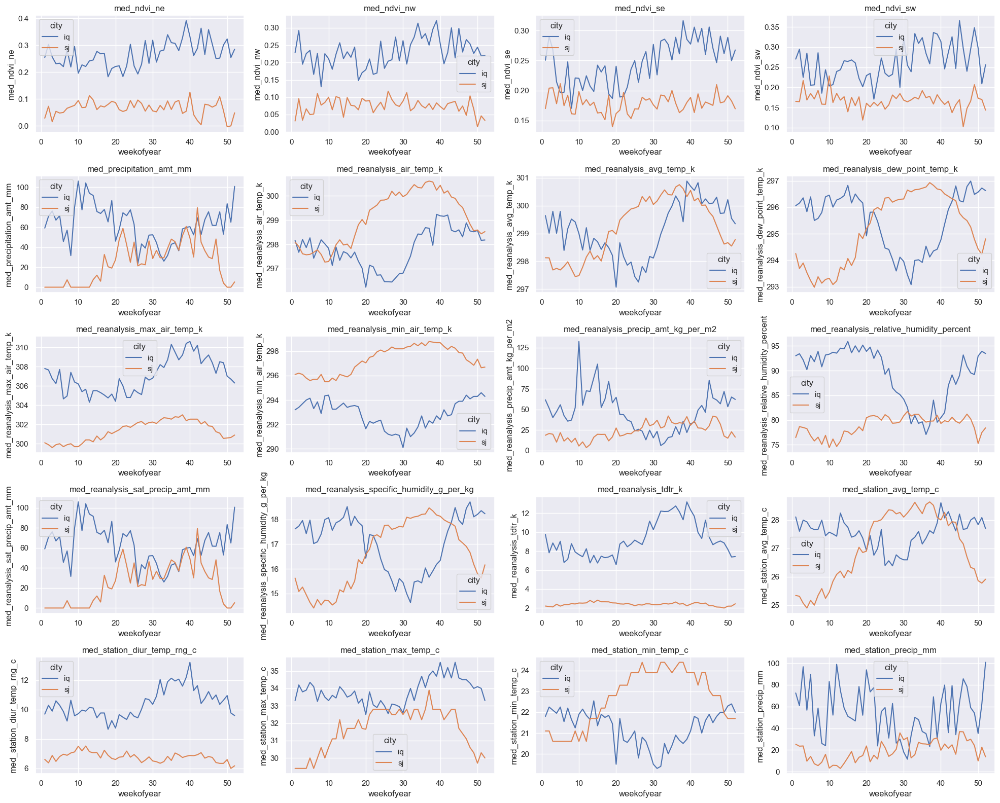

In [235]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized)

In [236]:
df_train_iq.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

## Iquitos
Key observations:
- There is a lagged commovement between temperature and total disease cases in iquitos, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

In [237]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

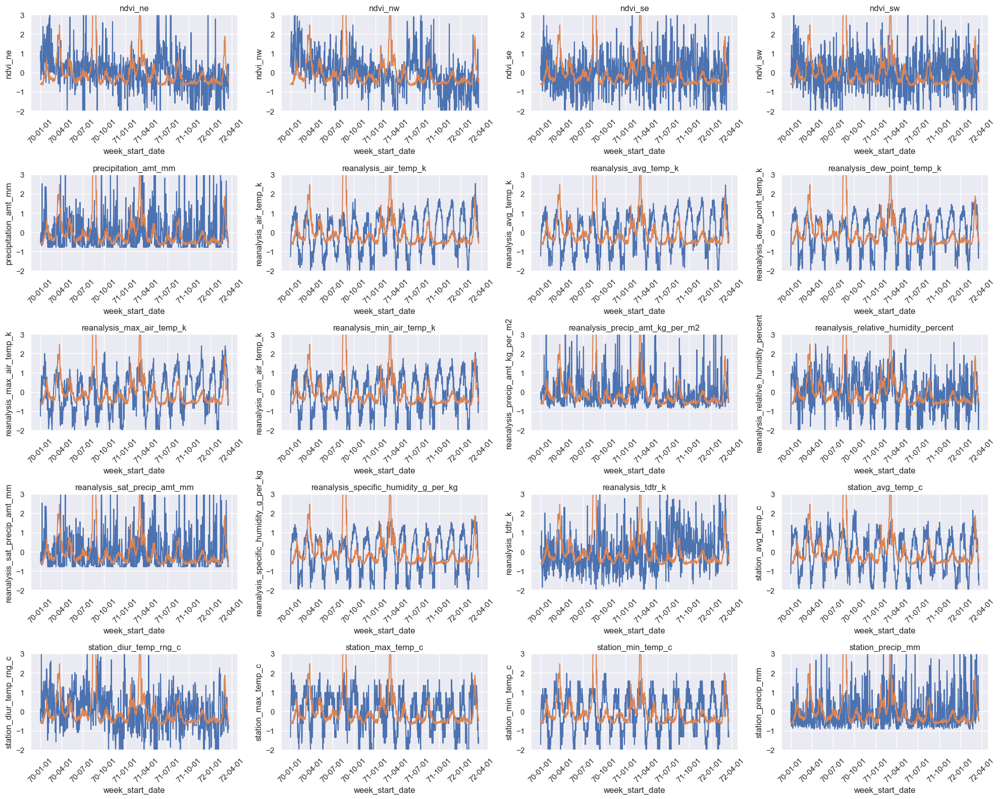

In [238]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

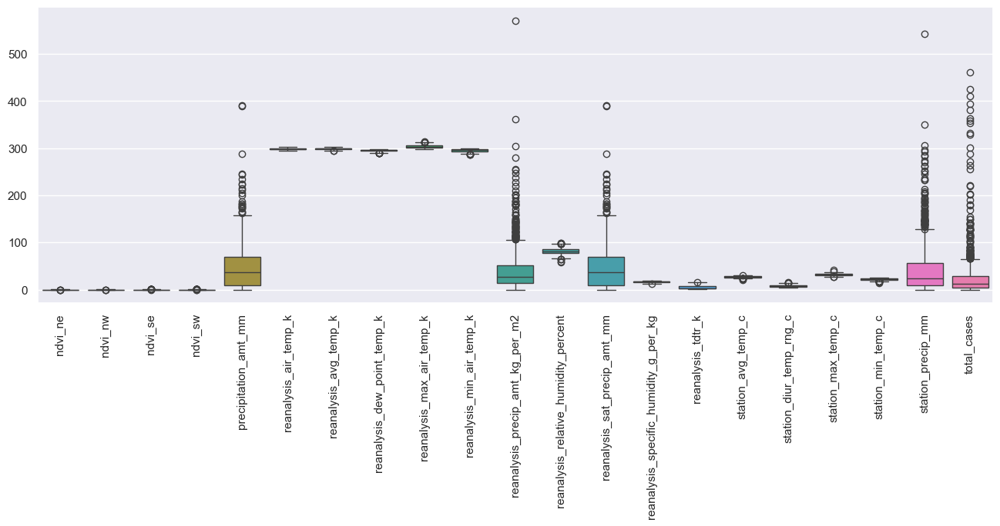

In [239]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots
- There is considerable difference between cities esp. for vegetation, humidity and temperature
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

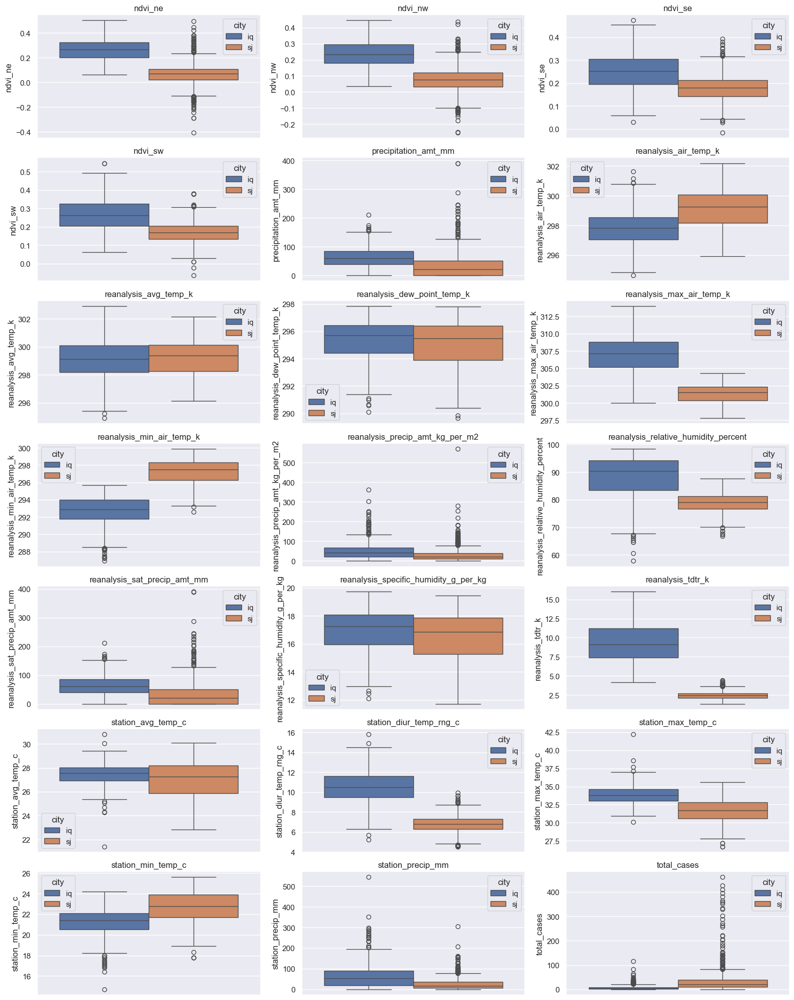

In [240]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

In [241]:
ndvi = list(filter(lambda x: re.search(r'ndvi_', x), features))
precip = list(filter(lambda x: re.search(r'preci', x), features))
humid = list(filter(lambda x: re.search(r'humid', x), features))
temp = list(filter(lambda x: re.search(r'temp|tdtr', x), features))
# tdtr = list(filter(lambda x: re.search(r'tdtr', x), features))

In [242]:
## PCA PLOTS
from sklearn.decomposition import PCA
pca = PCA(n_components=2, whiten=True)

pca_ndvi = pca.fit_transform(df_train.loc[df_train['city']=='sj',ndvi])
print('ndvi', pca.explained_variance_ratio_)
pca_ndvi = pd.DataFrame(pca_ndvi, columns=['pc1','pc2'])


pca_precip = pca.fit_transform(df_train.loc[df_train['city']=='sj',precip])
print('precip', pca.explained_variance_ratio_)
pca_precip = pd.DataFrame(pca_precip, columns=['pc1','pc2'])

pca_temp = pca.fit_transform(df_train.loc[df_train['city']=='sj',temp])
print('temp', pca.explained_variance_ratio_)
pca_temp = pd.DataFrame(pca_temp, columns=['pc1','pc2'])


ndvi [0.60810573 0.22842592]
precip [0.77866656 0.1463693 ]
temp [0.79642597 0.10359842]


In [243]:
df_train.loc[:,'l_total_cases'] = np.log(1+df_train['total_cases'])

#EDA: Data Visualization
[Helen]

In [244]:
# df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
# df_train.set_index('week_start_date', inplace=True)

In [245]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'iq']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of Iquitos:


*   The trend appears to be stable with slight flunctuations over the years, a slight upward trend can be observed around 2005 but it returns to more average levels afterward and then rises before 2007.
*   The Seasonal pattern is clear and consistent over the years. Peaks and troughs appear regularly, indicating consistent wetter and drier periods each year.
*   The residuals, which represent the noise after removing the trend and seasonality, don't show any significant outliers or patterns. They're relatively stable and clustered around the zero line.

In [246]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'sj']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of San Juan:


*   The trend appears to be stable with slight undulations over the years, there is no strong long term increase or decrease in the population during the time period.
*   The Seasonal pattern is clear and consistent over the years. The amplitude of the season flunctuations are roughly the same size each year.
*   The residuals have a few outliers, seen as dots further away 

##### Dropping one highly correlated variables from the following pairs, 
- ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
- ['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
- ['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']

In [ ]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only
colums2drop = ['reanalysis_sat_precip_amt_mm', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'total_cases']
features2keep = [f for f in features if f not in colums2drop]

X_train_iq = df_train.loc[df_train['city']=='iq',features2keep]
X_train_sj = df_train.loc[df_train['city']=='sj',features2keep]

X_test_iq = df_test.loc[df_test['city']=='iq',features2keep]
X_test_sj = df_test.loc[df_test['city']=='sj',features2keep]


y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']


y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']
# y_train_sj = df_train['total_cases']

In [ ]:
features2keep

In [ ]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [ ]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


## MODELS

In [265]:
# Removing outliers and scaling
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error


# Model without parameter tuning - San Juan
scaler = Pipeline([('scaler', RobustScaler())])
transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf',C=0.3)
pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

model = pipeline.fit(X=X_train_iq, y=y_train_iq)
# y_pred_tr = model.predict(X_train_iq)

y_pred_iq = model.predict(X_test_iq)

mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE: {mae:.2f}")




MAE: 4.72


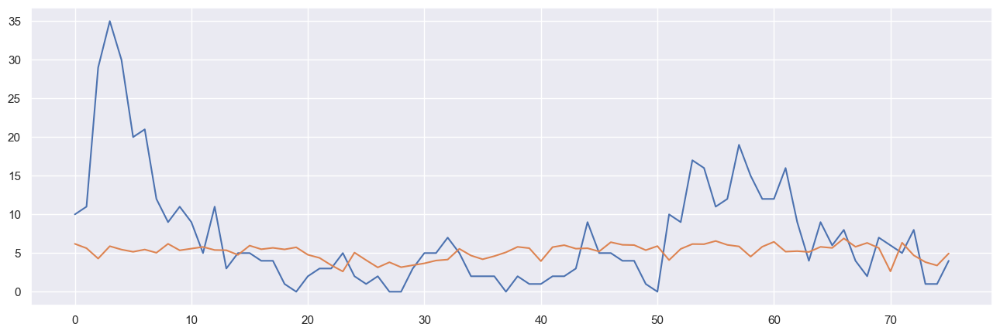

In [266]:
plt.plot(y_test_iq)
plt.plot(y_pred_iq)

In [267]:
# Model without parameter tuning - San Juan
scaler = Pipeline([('scaler', RobustScaler())])
transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf',C=0.3)
pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

model = pipeline.fit(X=X_train_sj, y=y_train_sj)
# y_pred_tr = model.predict(X_train_iq)

y_pred_sj = model.predict(X_test_sj)

mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE: {mae:.2f}")

MAE: 16.64


In [274]:
y_test_sj

76     13
77     10
78     17
79     19
80      9
       ..
192     4
193     3
194     1
195     3
196     5
Name: total_cases, Length: 121, dtype: int64

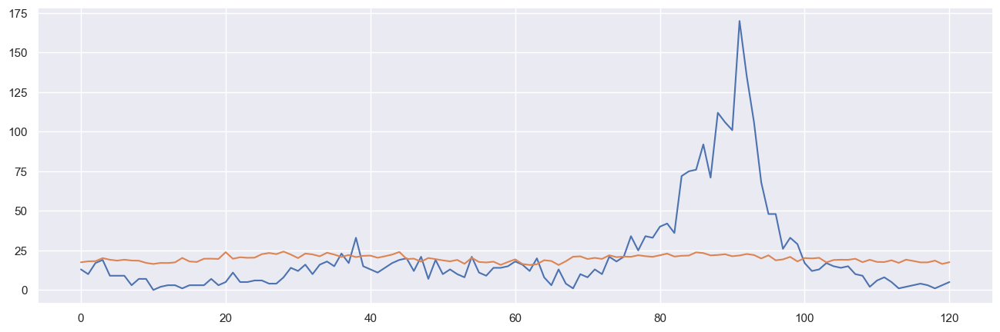

In [277]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


In [150]:
y_train_sj

week_start_date
1990-04-30     4
1990-05-07     5
1990-05-14     4
1990-05-21     3
1990-05-28     6
              ..
2005-11-26    22
2005-12-03    26
2005-12-10    13
2005-12-17    17
2005-12-24     8
Name: total_cases, Length: 809, dtype: int64

In [57]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from statsmodels.tsa.arima.model import ARIMA

# # Generate some example time series data
# np.random.seed(42)
# n = 100
# time_series = np.cumsum(np.random.randn(n))

# # Create a pandas DataFrame
# df = pd.DataFrame({'value': time_series})

# # Fit an ARIMA model
# model = ARIMA(df['value'], order=(1, 1, 1))  # Example order (p, d, q)
# model_fit = model.fit()

# # Make predictions
# forecast_steps = 10
# forecasts= model_fit.get_forecast(steps=forecast_steps)

# # # Plot the original time series and the forecast
# # plt.figure(figsize=(10, 6))
# # plt.plot(df['value'], label='Original Time Series')
# # plt.plot(range(n, n + forecast_steps), forecast, label='Forecast', color='red')
# # # plt.fill_between(range(n, n + forecast_steps), conf_int[:, 0], conf_int[:, 1], color='gray', alpha=0.3)
# # plt.xlabel('Time')
# # plt.ylabel('Value')
# # plt.title('ARIMA Forecast')
# # plt.legend()
# # plt.show()


In [58]:
help(forecasts)

Help on PredictionResultsWrapper in module statsmodels.tsa.statespace.mlemodel:

<statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object>
    Prediction result from MLE models
    
    Parameters
    ----------
    model : MLEModel
        The models used to make the prediction
    prediction_results : kalman_filter.PredictionResults instance
        Results object from prediction after fitting or filtering a state space
        model.
    row_labels : iterable
        Row labels for the predicted data.
    information_set : str
        Name of information set
    signal_only : bool
        Whether the prediction is for the signal only
    
    Attributes
    ----------
    model : MLEModel
        The models used to make the prediction
    prediction_results : kalman_filter.PredictionResults instance
        Results object from prediction after fitting or filtering a state space
        model.
    information_set : str
        Name of information set
    signal_only : boo

In [59]:
df_train.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,l_total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
2000-07-01,iq,2000,26,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,...,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0,0.0
2000-07-08,iq,2000,27,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,...,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0,0.0
2000-07-15,iq,2000,28,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,...,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0,0.0
2000-07-22,iq,2000,29,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,...,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0,0.0
2000-07-29,iq,2000,30,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,...,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0,0.0
